In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize']=8,3
sns.set_theme(style="whitegrid", palette="dark")

In [2]:
eye=pd.read_csv(r'C:\Users\admin\Downloads\archive\eye_cancer_patients.csv')

In [3]:
eye

,Patient_ID,Age,Gender,Cancer_Type,Laterality,Date_of_Diagnosis,Stage_at_Diagnosis,Treatment_Type,Surgery_Status,Radiation_Therapy,Chemotherapy,Outcome_Status,Survival_Time_Months,Genetic_Markers,Family_History,Country
0,PID00001,58,F,Retinoblastoma,Left,2019-01-25,Stage IV,Radiation,False,15,3,Deceased,85,NaN,True,UK
1,PID00002,15,Other,Retinoblastoma,Right,2021-10-21,Stage III,Chemotherapy,True,69,6,In Remission,10,NaN,True,Japan
2,PID00003,64,M,Retinoblastoma,Bilateral,2021-03-12,Stage IV,Surgery,False,47,6,In Remission,3,BRAF Mutation,False,UK
3,PID00004,33,M,Melanoma,Right,2021-05-10,Stage II,Radiation,True,36,6,Active,40,NaN,False,Canada
4,PID00005,8,Other,Lymphoma,Left,2019-11-24,Stage I,Chemotherapy,False,14,14,In Remission,26,BRAF Mutation,True,USA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,PID04996,63,M,Retinoblastoma,Left,2022-09-18,Stage III,Surgery,False,38,13,Active,34,BRAF Mutation,False,USA
4996,PID04997,43,M,Lymphoma,Right,2022-03-02,Stage I,Chemotherapy,False,70,9,Active,27,NaN,False,Australia
4997,PID04998,88,Other,Lymphoma,Left,2024-04-09,Stage I,Radiation,False,48,20,Active,71,NaN,True,USA
4998,PID04999,34,Other,Melanoma,Bilateral,2021-01-15,Stage III,Surgery,False,61,1,In Remission,30,BRAF Mutation,False,South Africa


In [4]:
eye.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Patient_ID            5000 non-null   object
 1   Age                   5000 non-null   int64 
 2   Gender                5000 non-null   object
 3   Cancer_Type           5000 non-null   object
 4   Laterality            5000 non-null   object
 5   Date_of_Diagnosis     5000 non-null   object
 6   Stage_at_Diagnosis    5000 non-null   object
 7   Treatment_Type        5000 non-null   object
 8   Surgery_Status        5000 non-null   bool  
 9   Radiation_Therapy     5000 non-null   int64 
 10  Chemotherapy          5000 non-null   int64 
 11  Outcome_Status        5000 non-null   object
 12  Survival_Time_Months  5000 non-null   int64 
 13  Genetic_Markers       2503 non-null   object
 14  Family_History        5000 non-null   bool  
 15  Country               5000 non-null   

In [5]:
eye.isnull().sum()

Patient_ID                 0
Age                        0
Gender                     0
Cancer_Type                0
Laterality                 0
Date_of_Diagnosis          0
Stage_at_Diagnosis         0
Treatment_Type             0
Surgery_Status             0
Radiation_Therapy          0
Chemotherapy               0
Outcome_Status             0
Survival_Time_Months       0
Genetic_Markers         2497
Family_History             0
Country                    0
dtype: int64

In [6]:
eye['Genetic_Markers'] = eye['Genetic_Markers'].fillna('Unknown')

In [7]:
eye.columns

Index(['Patient_ID', 'Age', 'Gender', 'Cancer_Type', 'Laterality',
       'Date_of_Diagnosis', 'Stage_at_Diagnosis', 'Treatment_Type',
       'Surgery_Status', 'Radiation_Therapy', 'Chemotherapy', 'Outcome_Status',
       'Survival_Time_Months', 'Genetic_Markers', 'Family_History', 'Country'],
      dtype='object')

In [8]:
len(eye.columns)

16

In [9]:
eye.describe()

,Age,Radiation_Therapy,Chemotherapy,Survival_Time_Months
count,5000.000000,5000.000000,5000.000000,5000.000000
mean,45.008000,35.447600,10.057400,60.716000
std,25.934387,20.565754,6.030968,34.549774
min,1.000000,0.000000,0.000000,1.000000
25%,22.000000,18.000000,5.000000,31.000000
50%,44.000000,35.000000,10.000000,60.000000
75%,67.000000,53.000000,15.000000,90.000000
max,90.000000,70.000000,20.000000,120.000000


In [10]:
eye.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Age,5000.0,45.0080,25.934387,1.0,22.0,44.0,67.0,90.0
Radiation_Therapy,5000.0,35.4476,20.565754,0.0,18.0,35.0,53.0,70.0
Chemotherapy,5000.0,10.0574,6.030968,0.0,5.0,10.0,15.0,20.0
Survival_Time_Months,5000.0,60.7160,34.549774,1.0,31.0,60.0,90.0,120.0


In [11]:
eye.head()

,Patient_ID,Age,Gender,Cancer_Type,Laterality,Date_of_Diagnosis,Stage_at_Diagnosis,Treatment_Type,Surgery_Status,Radiation_Therapy,Chemotherapy,Outcome_Status,Survival_Time_Months,Genetic_Markers,Family_History,Country
0,PID00001,58,F,Retinoblastoma,Left,2019-01-25,Stage IV,Radiation,False,15,3,Deceased,85,Unknown,True,UK
1,PID00002,15,Other,Retinoblastoma,Right,2021-10-21,Stage III,Chemotherapy,True,69,6,In Remission,10,Unknown,True,Japan
2,PID00003,64,M,Retinoblastoma,Bilateral,2021-03-12,Stage IV,Surgery,False,47,6,In Remission,3,BRAF Mutation,False,UK
3,PID00004,33,M,Melanoma,Right,2021-05-10,Stage II,Radiation,True,36,6,Active,40,Unknown,False,Canada
4,PID00005,8,Other,Lymphoma,Left,2019-11-24,Stage I,Chemotherapy,False,14,14,In Remission,26,BRAF Mutation,True,USA


<Axes: xlabel='Age', ylabel='Density'>

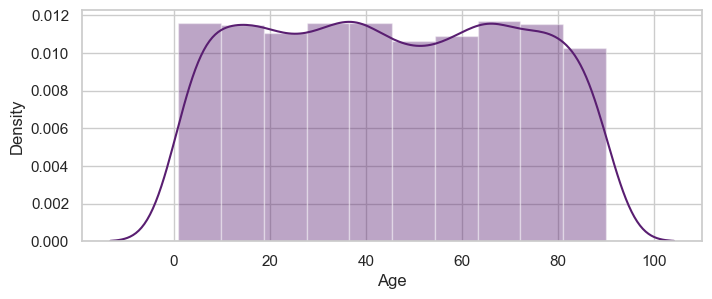

In [12]:
sns.distplot(eye.Age,color='m',bins=10)

<Axes: xlabel='Radiation_Therapy', ylabel='Density'>

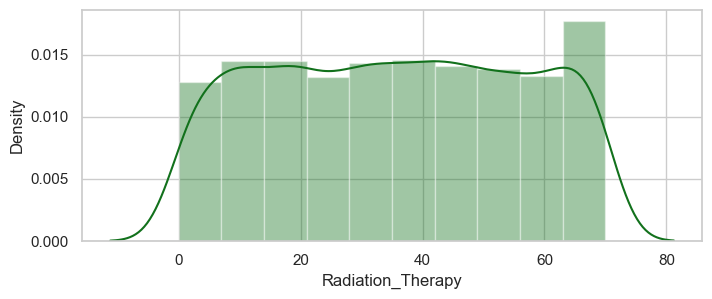

In [13]:
sns.distplot(eye.Radiation_Therapy,color='g',bins=10)

<Axes: xlabel='Chemotherapy', ylabel='Density'>

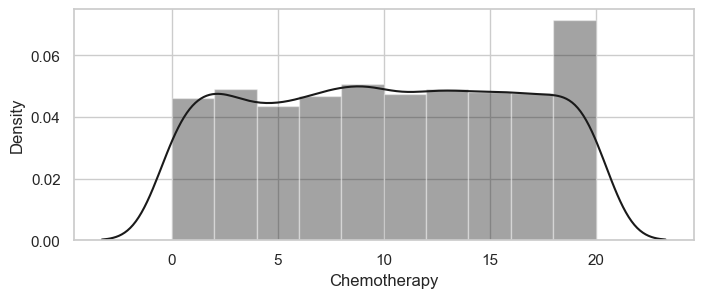

In [14]:
sns.distplot(eye.Chemotherapy,color='k',bins=10)

<Axes: xlabel='Survival_Time_Months', ylabel='Density'>

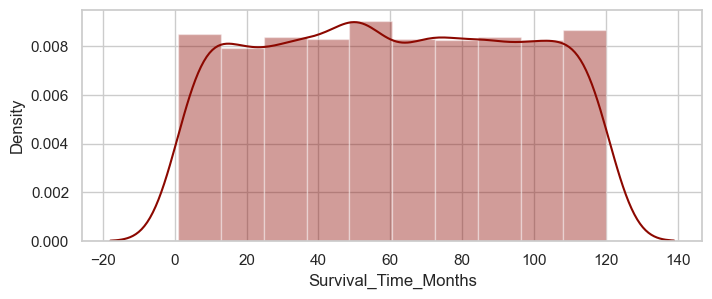

In [15]:
sns.distplot(eye.Survival_Time_Months,color='r',bins=10)

In [16]:
eye.head()

,Patient_ID,Age,Gender,Cancer_Type,Laterality,Date_of_Diagnosis,Stage_at_Diagnosis,Treatment_Type,Surgery_Status,Radiation_Therapy,Chemotherapy,Outcome_Status,Survival_Time_Months,Genetic_Markers,Family_History,Country
0,PID00001,58,F,Retinoblastoma,Left,2019-01-25,Stage IV,Radiation,False,15,3,Deceased,85,Unknown,True,UK
1,PID00002,15,Other,Retinoblastoma,Right,2021-10-21,Stage III,Chemotherapy,True,69,6,In Remission,10,Unknown,True,Japan
2,PID00003,64,M,Retinoblastoma,Bilateral,2021-03-12,Stage IV,Surgery,False,47,6,In Remission,3,BRAF Mutation,False,UK
3,PID00004,33,M,Melanoma,Right,2021-05-10,Stage II,Radiation,True,36,6,Active,40,Unknown,False,Canada
4,PID00005,8,Other,Lymphoma,Left,2019-11-24,Stage I,Chemotherapy,False,14,14,In Remission,26,BRAF Mutation,True,USA


<Axes: xlabel='Gender', ylabel='count'>

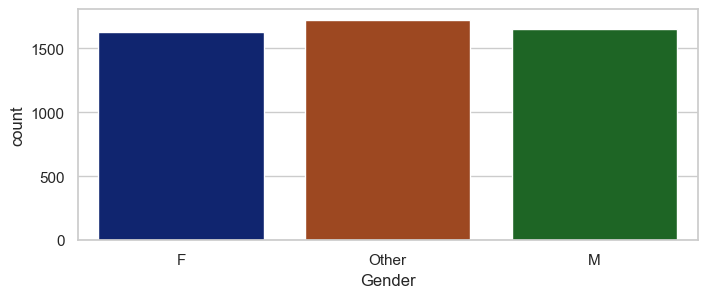

In [17]:
sns.countplot(data=eye,x='Gender',palette='dark')

<Axes: xlabel='Cancer_Type', ylabel='count'>

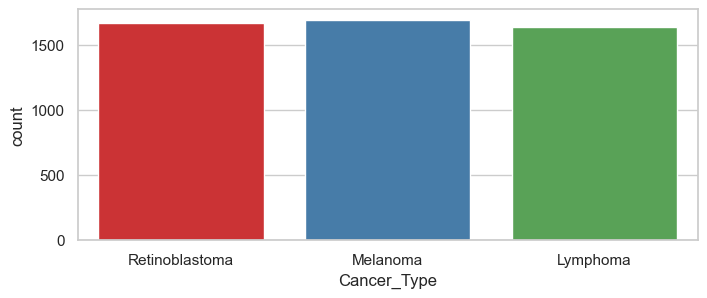

In [18]:
sns.countplot(data=eye,x='Cancer_Type',palette='Set1')

<Axes: xlabel='Laterality', ylabel='count'>

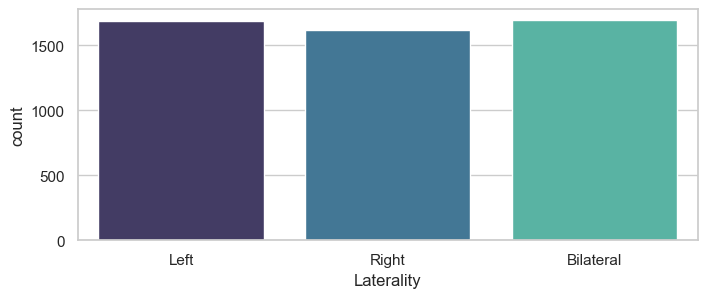

In [19]:
sns.countplot(data=eye,x='Laterality',palette='mako')

<Axes: xlabel='Stage_at_Diagnosis', ylabel='count'>

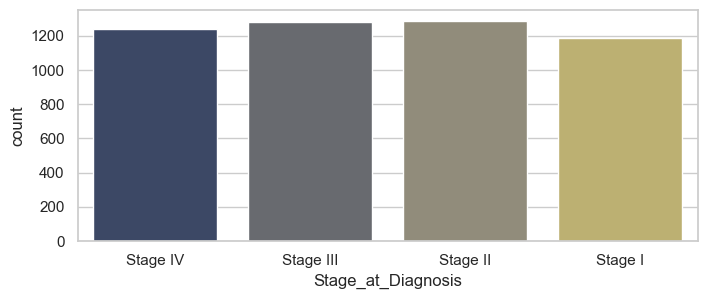

In [20]:
sns.countplot(data=eye,x='Stage_at_Diagnosis',palette='cividis')

<Axes: xlabel='Treatment_Type', ylabel='count'>

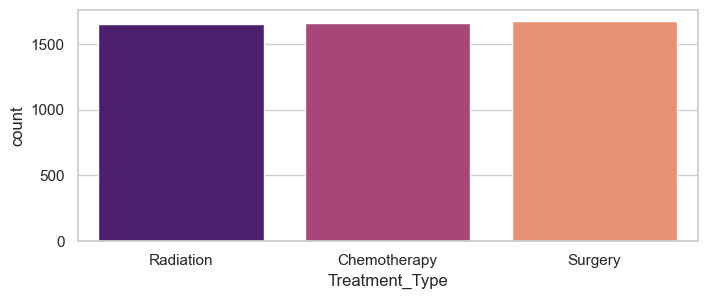

In [21]:
sns.countplot(data=eye,x='Treatment_Type',palette='magma')

<Axes: xlabel='Surgery_Status', ylabel='count'>

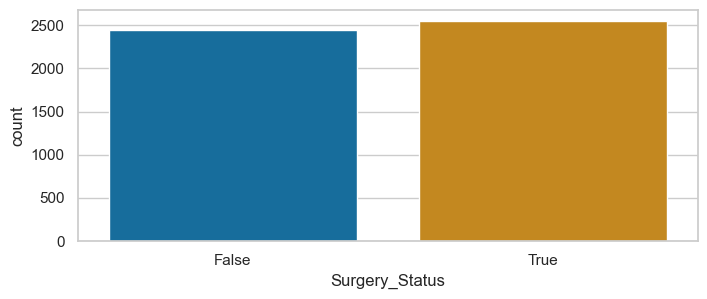

In [22]:
sns.countplot(data=eye,x='Surgery_Status',palette='colorblind')

<Axes: xlabel='Outcome_Status', ylabel='count'>

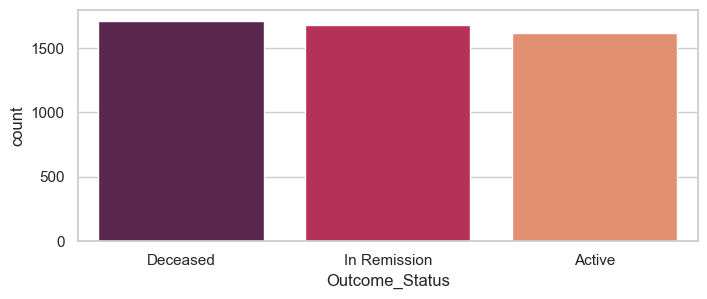

In [23]:
sns.countplot(data=eye,x='Outcome_Status',palette='rocket')

<Axes: xlabel='Genetic_Markers', ylabel='count'>

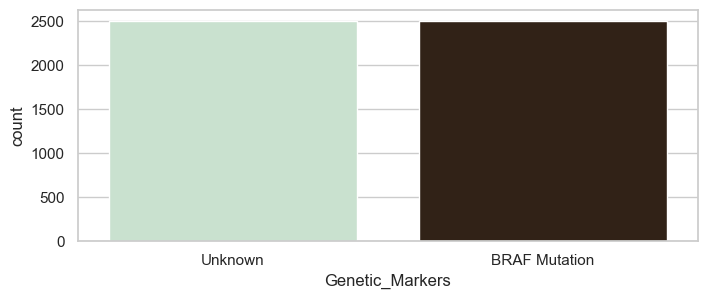

In [24]:
sns.countplot(data=eye,x='Genetic_Markers',palette='ch:34')

<Axes: xlabel='Family_History', ylabel='count'>

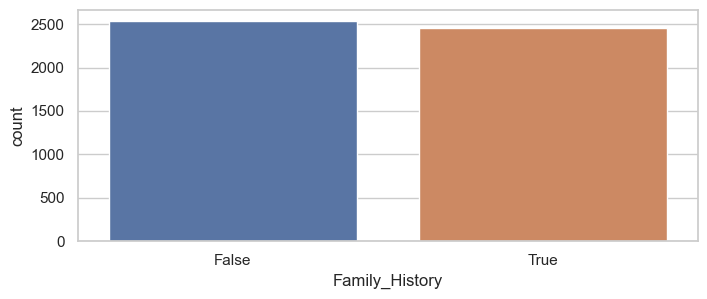

In [25]:
sns.countplot(data=eye,x='Family_History',palette='deep')

<Axes: xlabel='Country', ylabel='count'>

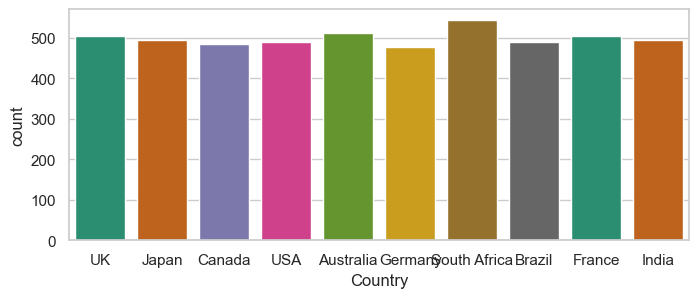

In [26]:
sns.countplot(data=eye,x='Country',palette='Dark2')

In [27]:
eye.head()

,Patient_ID,Age,Gender,Cancer_Type,Laterality,Date_of_Diagnosis,Stage_at_Diagnosis,Treatment_Type,Surgery_Status,Radiation_Therapy,Chemotherapy,Outcome_Status,Survival_Time_Months,Genetic_Markers,Family_History,Country
0,PID00001,58,F,Retinoblastoma,Left,2019-01-25,Stage IV,Radiation,False,15,3,Deceased,85,Unknown,True,UK
1,PID00002,15,Other,Retinoblastoma,Right,2021-10-21,Stage III,Chemotherapy,True,69,6,In Remission,10,Unknown,True,Japan
2,PID00003,64,M,Retinoblastoma,Bilateral,2021-03-12,Stage IV,Surgery,False,47,6,In Remission,3,BRAF Mutation,False,UK
3,PID00004,33,M,Melanoma,Right,2021-05-10,Stage II,Radiation,True,36,6,Active,40,Unknown,False,Canada
4,PID00005,8,Other,Lymphoma,Left,2019-11-24,Stage I,Chemotherapy,False,14,14,In Remission,26,BRAF Mutation,True,USA


<Axes: xlabel='Gender', ylabel='count'>

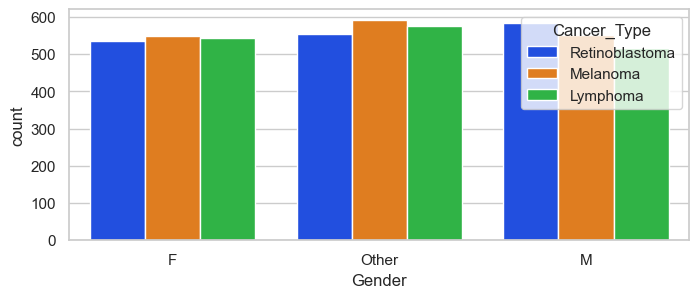

In [28]:
sns.countplot(data=eye,x='Gender',hue='Cancer_Type',palette='bright')

<Axes: xlabel='Laterality', ylabel='count'>

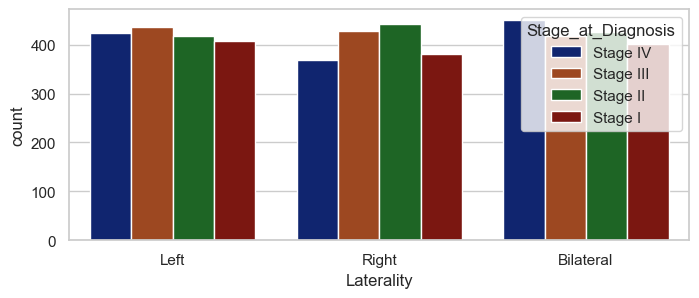

In [29]:
sns.countplot(data=eye,x='Laterality',hue='Stage_at_Diagnosis',palette='dark')

<Axes: xlabel='Treatment_Type', ylabel='count'>

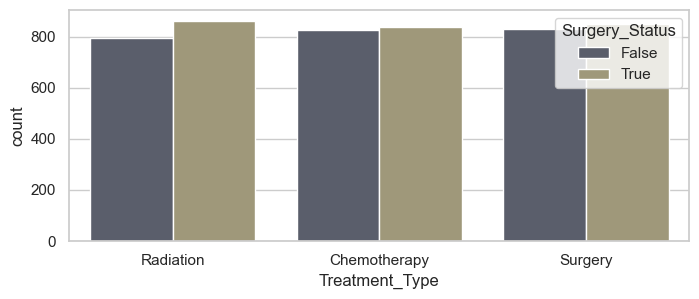

In [30]:
sns.countplot(data=eye,x='Treatment_Type',hue='Surgery_Status',palette='cividis')

<Axes: xlabel='Outcome_Status', ylabel='count'>

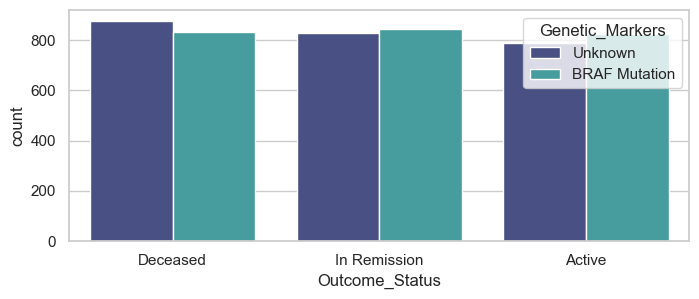

In [31]:
sns.countplot(data=eye,x='Outcome_Status',hue='Genetic_Markers',palette='mako')

<Axes: xlabel='Family_History', ylabel='count'>

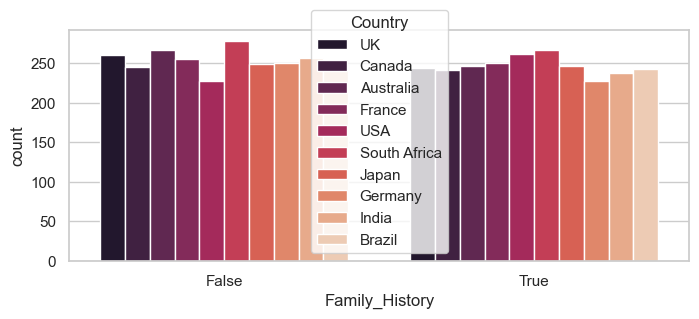

In [32]:
sns.countplot(data=eye,x='Family_History',hue='Country',palette='rocket')

<Axes: xlabel='Country', ylabel='count'>

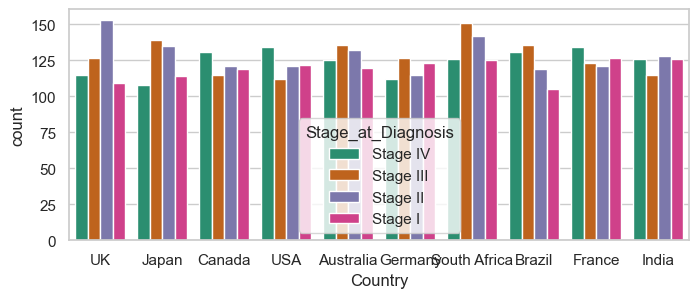

In [33]:
sns.countplot(data=eye,x='Country',hue='Stage_at_Diagnosis',palette='Dark2')

In [34]:
eye.head()

,Patient_ID,Age,Gender,Cancer_Type,Laterality,Date_of_Diagnosis,Stage_at_Diagnosis,Treatment_Type,Surgery_Status,Radiation_Therapy,Chemotherapy,Outcome_Status,Survival_Time_Months,Genetic_Markers,Family_History,Country
0,PID00001,58,F,Retinoblastoma,Left,2019-01-25,Stage IV,Radiation,False,15,3,Deceased,85,Unknown,True,UK
1,PID00002,15,Other,Retinoblastoma,Right,2021-10-21,Stage III,Chemotherapy,True,69,6,In Remission,10,Unknown,True,Japan
2,PID00003,64,M,Retinoblastoma,Bilateral,2021-03-12,Stage IV,Surgery,False,47,6,In Remission,3,BRAF Mutation,False,UK
3,PID00004,33,M,Melanoma,Right,2021-05-10,Stage II,Radiation,True,36,6,Active,40,Unknown,False,Canada
4,PID00005,8,Other,Lymphoma,Left,2019-11-24,Stage I,Chemotherapy,False,14,14,In Remission,26,BRAF Mutation,True,USA


<Axes: xlabel='Gender', ylabel='Age'>

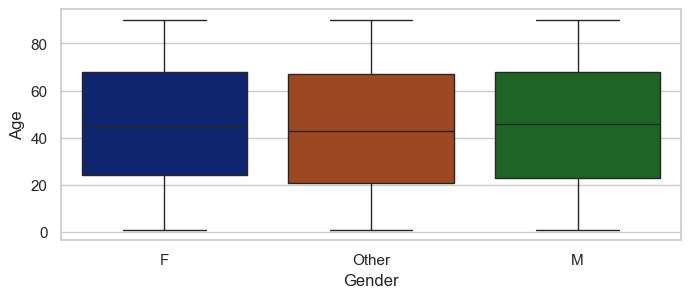

In [35]:
sns.boxplot(data=eye,x='Gender',y='Age',palette='dark')

<Axes: xlabel='Cancer_Type', ylabel='Radiation_Therapy'>

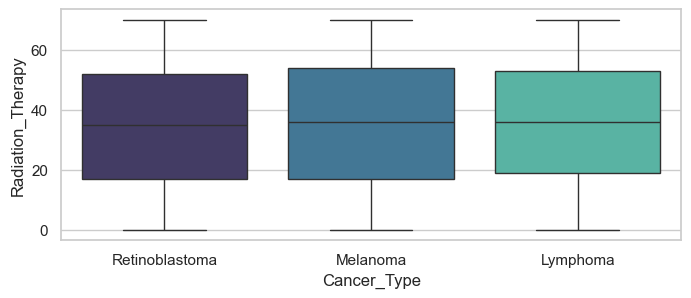

In [36]:
sns.boxplot(data=eye,x='Cancer_Type',y='Radiation_Therapy',palette='mako')

<Axes: xlabel='Laterality', ylabel='Chemotherapy'>

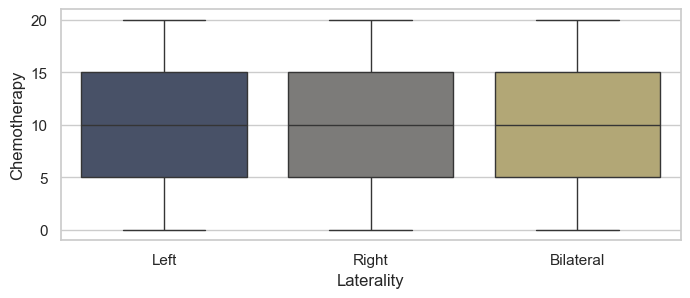

In [37]:
sns.boxplot(data=eye,x='Laterality',y='Chemotherapy',palette='cividis')

<Axes: xlabel='Stage_at_Diagnosis', ylabel='Survival_Time_Months'>

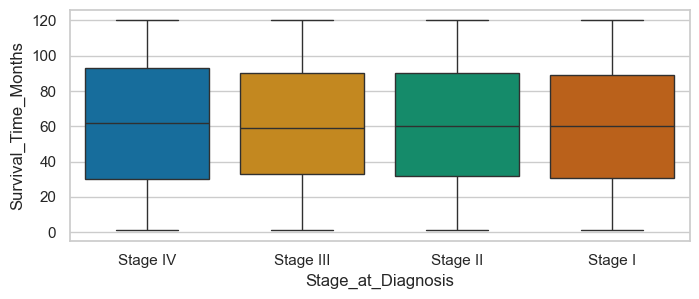

In [38]:
sns.boxplot(data=eye,x='Stage_at_Diagnosis',y='Survival_Time_Months',palette='colorblind')

<Axes: xlabel='Treatment_Type', ylabel='Age'>

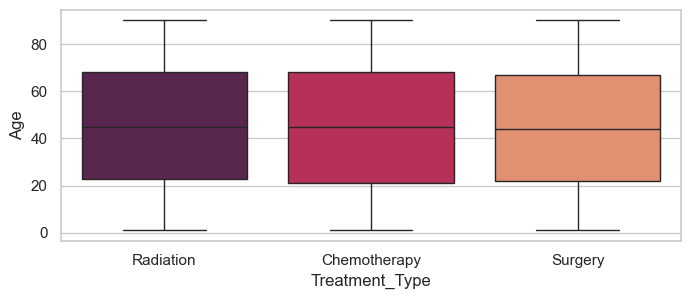

In [39]:
sns.boxplot(data=eye,x='Treatment_Type',y='Age',palette='rocket')

<Axes: xlabel='Outcome_Status', ylabel='Radiation_Therapy'>

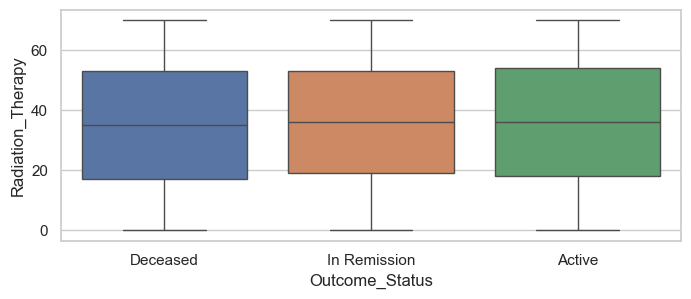

In [40]:
sns.boxplot(data=eye,x='Outcome_Status',y='Radiation_Therapy',palette='deep')

<Axes: xlabel='Genetic_Markers', ylabel='Chemotherapy'>

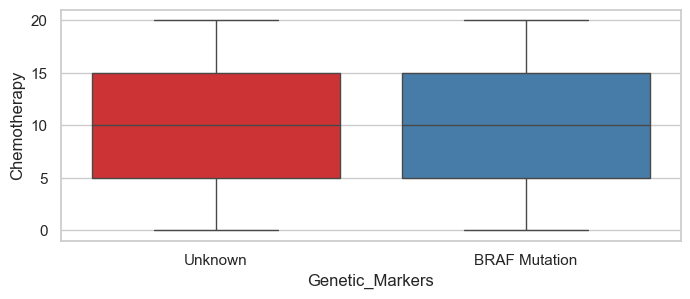

In [41]:
sns.boxplot(data=eye,x='Genetic_Markers',y='Chemotherapy',palette='Set1')

<Axes: xlabel='Country', ylabel='Survival_Time_Months'>

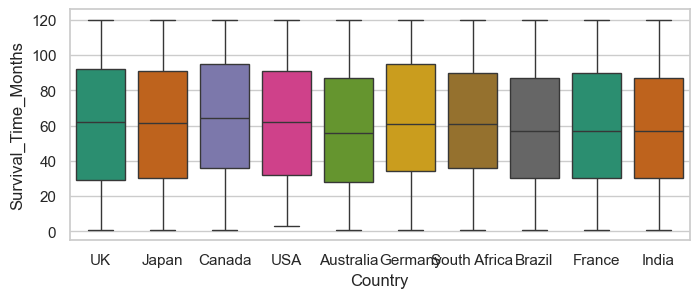

In [42]:
sns.boxplot(data=eye,x='Country',y='Survival_Time_Months',palette='Dark2')

In [43]:
eye.head()

,Patient_ID,Age,Gender,Cancer_Type,Laterality,Date_of_Diagnosis,Stage_at_Diagnosis,Treatment_Type,Surgery_Status,Radiation_Therapy,Chemotherapy,Outcome_Status,Survival_Time_Months,Genetic_Markers,Family_History,Country
0,PID00001,58,F,Retinoblastoma,Left,2019-01-25,Stage IV,Radiation,False,15,3,Deceased,85,Unknown,True,UK
1,PID00002,15,Other,Retinoblastoma,Right,2021-10-21,Stage III,Chemotherapy,True,69,6,In Remission,10,Unknown,True,Japan
2,PID00003,64,M,Retinoblastoma,Bilateral,2021-03-12,Stage IV,Surgery,False,47,6,In Remission,3,BRAF Mutation,False,UK
3,PID00004,33,M,Melanoma,Right,2021-05-10,Stage II,Radiation,True,36,6,Active,40,Unknown,False,Canada
4,PID00005,8,Other,Lymphoma,Left,2019-11-24,Stage I,Chemotherapy,False,14,14,In Remission,26,BRAF Mutation,True,USA


<Axes: xlabel='Gender', ylabel='Age'>

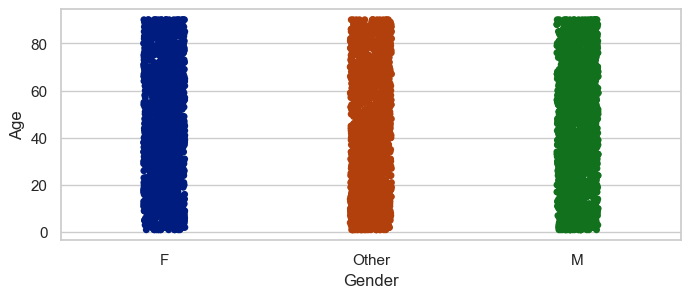

In [44]:
sns.stripplot(data=eye,x='Gender',y='Age',palette='dark')

<Axes: xlabel='Cancer_Type', ylabel='Radiation_Therapy'>

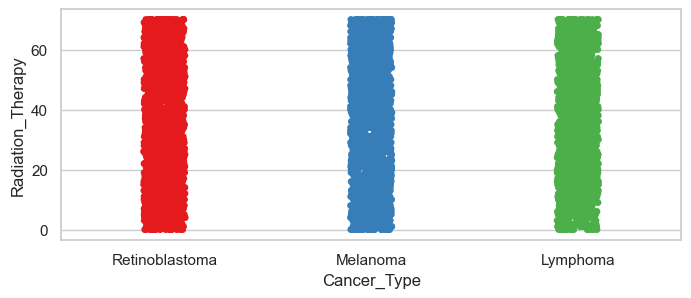

In [45]:
sns.stripplot(data=eye,x='Cancer_Type',y='Radiation_Therapy',palette='Set1')

<Axes: xlabel='Laterality', ylabel='Chemotherapy'>

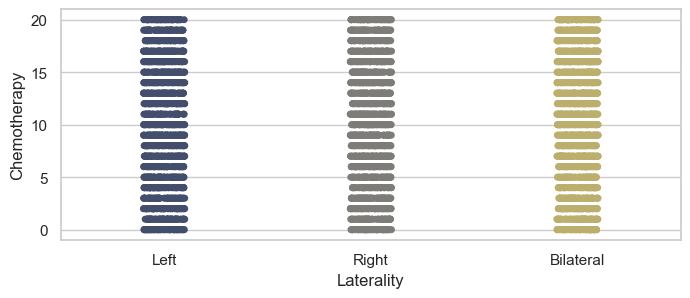

In [46]:
sns.stripplot(data=eye,x='Laterality',y='Chemotherapy',palette='cividis')

<Axes: xlabel='Stage_at_Diagnosis', ylabel='Survival_Time_Months'>

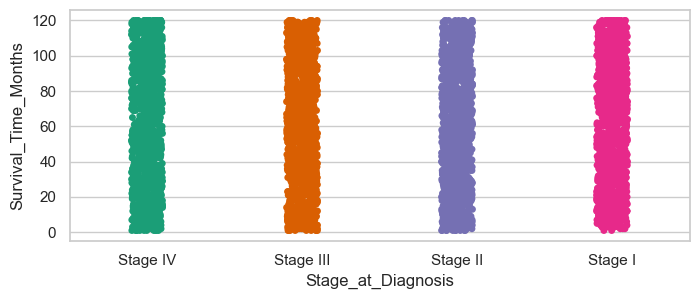

In [47]:
sns.stripplot(data=eye,x='Stage_at_Diagnosis',y='Survival_Time_Months',palette='Dark2')

<Axes: xlabel='Treatment_Type', ylabel='Radiation_Therapy'>

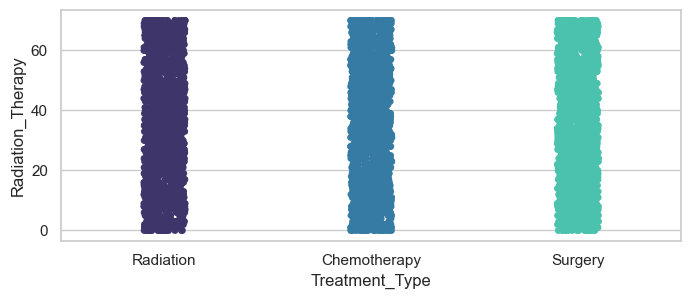

In [48]:
sns.stripplot(data=eye,x='Treatment_Type',y='Radiation_Therapy',palette='mako')

<Axes: xlabel='Outcome_Status', ylabel='Age'>

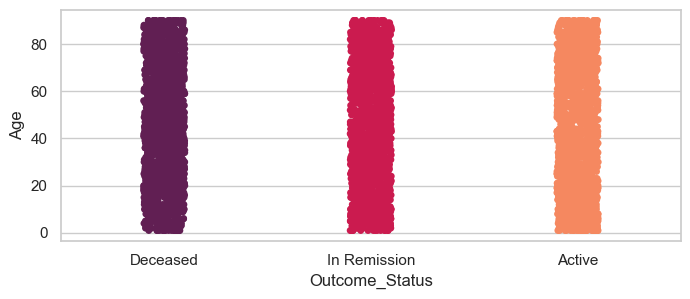

In [49]:
sns.stripplot(data=eye,x='Outcome_Status',y='Age',palette='rocket')

<Axes: xlabel='Genetic_Markers', ylabel='Chemotherapy'>

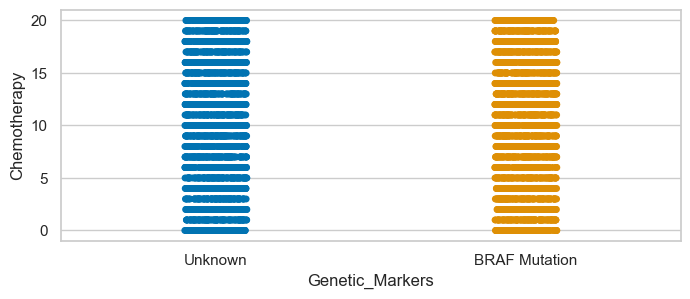

In [50]:
sns.stripplot(data=eye,x='Genetic_Markers',y='Chemotherapy',palette='colorblind')

<Axes: xlabel='Country', ylabel='Age'>

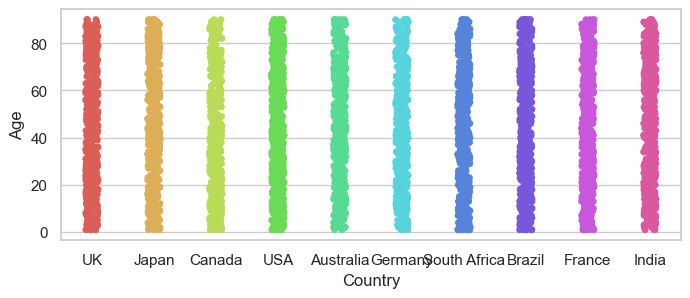

In [51]:
sns.stripplot(data=eye,x='Country',y='Age',palette='hls')

In [52]:
eye.head()

,Patient_ID,Age,Gender,Cancer_Type,Laterality,Date_of_Diagnosis,Stage_at_Diagnosis,Treatment_Type,Surgery_Status,Radiation_Therapy,Chemotherapy,Outcome_Status,Survival_Time_Months,Genetic_Markers,Family_History,Country
0,PID00001,58,F,Retinoblastoma,Left,2019-01-25,Stage IV,Radiation,False,15,3,Deceased,85,Unknown,True,UK
1,PID00002,15,Other,Retinoblastoma,Right,2021-10-21,Stage III,Chemotherapy,True,69,6,In Remission,10,Unknown,True,Japan
2,PID00003,64,M,Retinoblastoma,Bilateral,2021-03-12,Stage IV,Surgery,False,47,6,In Remission,3,BRAF Mutation,False,UK
3,PID00004,33,M,Melanoma,Right,2021-05-10,Stage II,Radiation,True,36,6,Active,40,Unknown,False,Canada
4,PID00005,8,Other,Lymphoma,Left,2019-11-24,Stage I,Chemotherapy,False,14,14,In Remission,26,BRAF Mutation,True,USA


<Axes: xlabel='Age', ylabel='Density'>

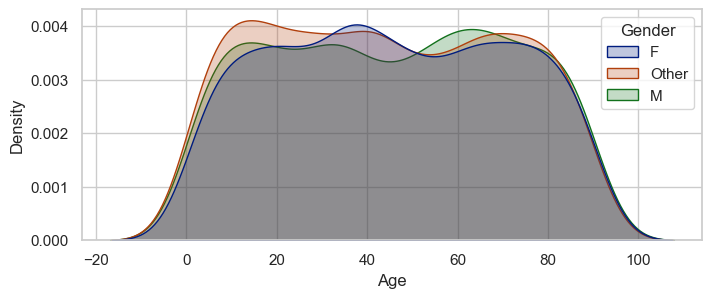

In [53]:
sns.kdeplot(data=eye,x='Age',hue='Gender',palette='dark',fill=True)

<Axes: xlabel='Radiation_Therapy', ylabel='Density'>

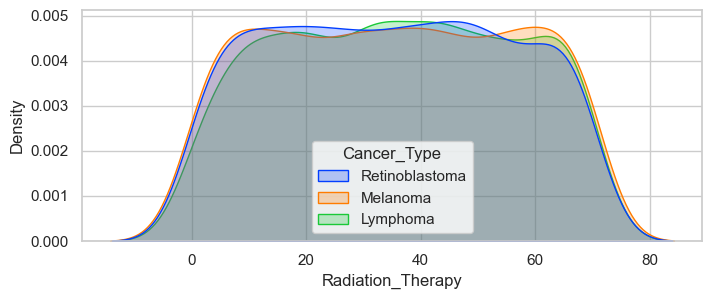

In [54]:
sns.kdeplot(data=eye,x='Radiation_Therapy',hue='Cancer_Type',palette='bright',fill=True)

<Axes: xlabel='Chemotherapy', ylabel='Density'>

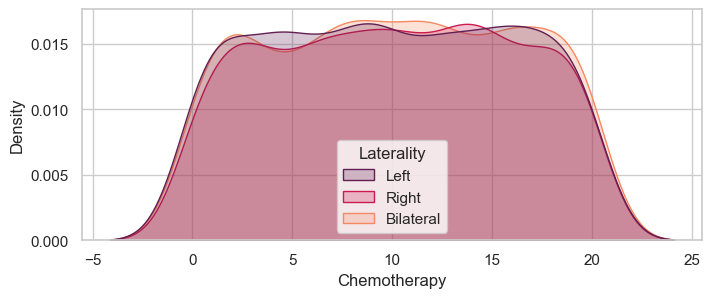

In [55]:
sns.kdeplot(data=eye,x='Chemotherapy',hue='Laterality',palette='rocket',fill=True)

<Axes: xlabel='Survival_Time_Months', ylabel='Density'>

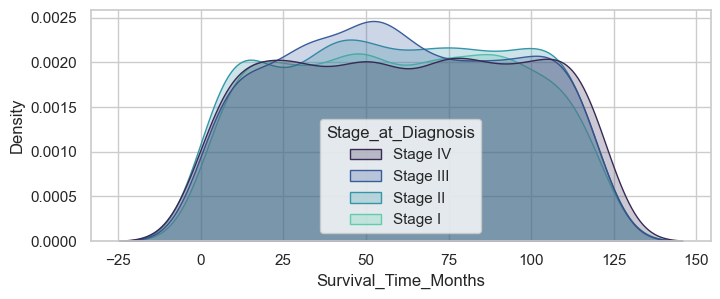

In [56]:
sns.kdeplot(data=eye,x='Survival_Time_Months',hue='Stage_at_Diagnosis',palette='mako',fill=True)

<Axes: xlabel='Age', ylabel='Density'>

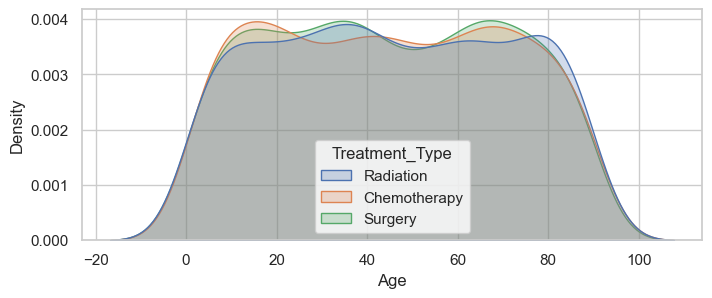

In [57]:
sns.kdeplot(data=eye,x='Age',hue='Treatment_Type',palette='deep',fill=True)

<Axes: xlabel='Radiation_Therapy', ylabel='Density'>

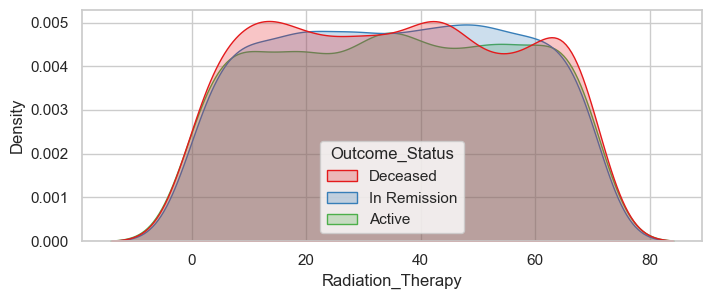

In [58]:
sns.kdeplot(data=eye,x='Radiation_Therapy',hue='Outcome_Status',palette='Set1',fill=True)

<Axes: xlabel='Chemotherapy', ylabel='Density'>

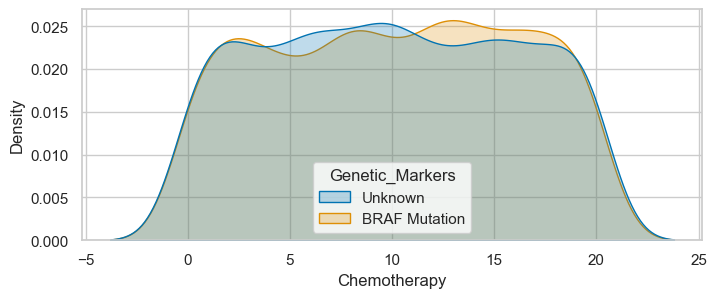

In [59]:
sns.kdeplot(data=eye,x='Chemotherapy',hue='Genetic_Markers',palette='colorblind',fill=True)

<Axes: xlabel='Age', ylabel='Density'>

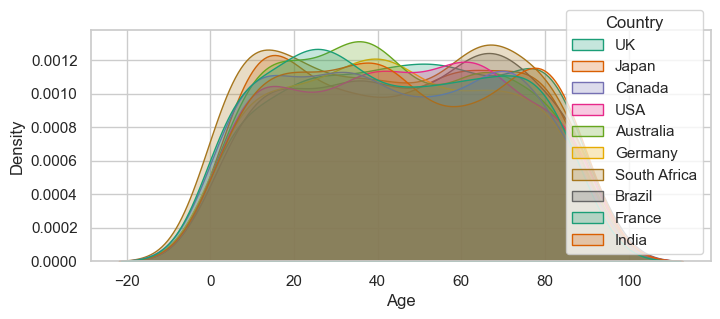

In [60]:
sns.kdeplot(data=eye,x='Age',hue='Country',palette='Dark2',fill=True)

In [61]:
eye.head()

,Patient_ID,Age,Gender,Cancer_Type,Laterality,Date_of_Diagnosis,Stage_at_Diagnosis,Treatment_Type,Surgery_Status,Radiation_Therapy,Chemotherapy,Outcome_Status,Survival_Time_Months,Genetic_Markers,Family_History,Country
0,PID00001,58,F,Retinoblastoma,Left,2019-01-25,Stage IV,Radiation,False,15,3,Deceased,85,Unknown,True,UK
1,PID00002,15,Other,Retinoblastoma,Right,2021-10-21,Stage III,Chemotherapy,True,69,6,In Remission,10,Unknown,True,Japan
2,PID00003,64,M,Retinoblastoma,Bilateral,2021-03-12,Stage IV,Surgery,False,47,6,In Remission,3,BRAF Mutation,False,UK
3,PID00004,33,M,Melanoma,Right,2021-05-10,Stage II,Radiation,True,36,6,Active,40,Unknown,False,Canada
4,PID00005,8,Other,Lymphoma,Left,2019-11-24,Stage I,Chemotherapy,False,14,14,In Remission,26,BRAF Mutation,True,USA


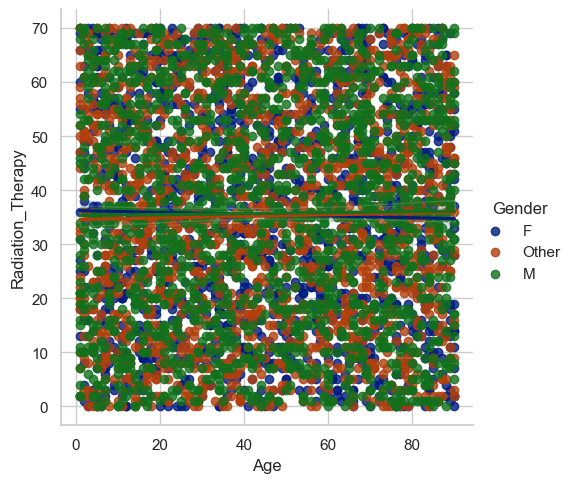

In [62]:
sns.lmplot(data=eye,x='Age',y='Radiation_Therapy',palette='dark',hue='Gender')

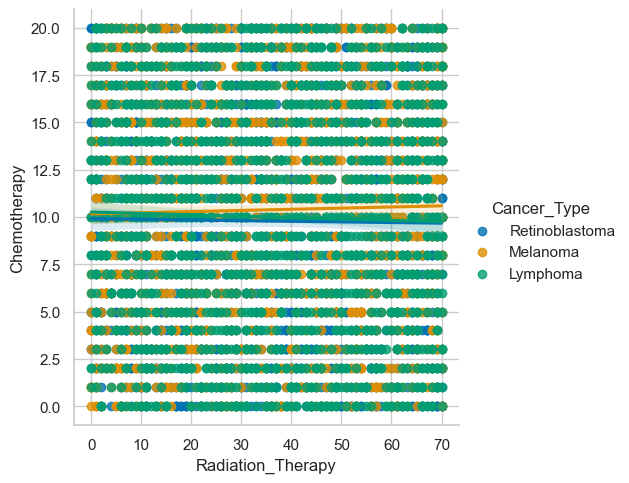

In [63]:
sns.lmplot(data=eye,x='Radiation_Therapy',y='Chemotherapy',palette='colorblind',hue='Cancer_Type')

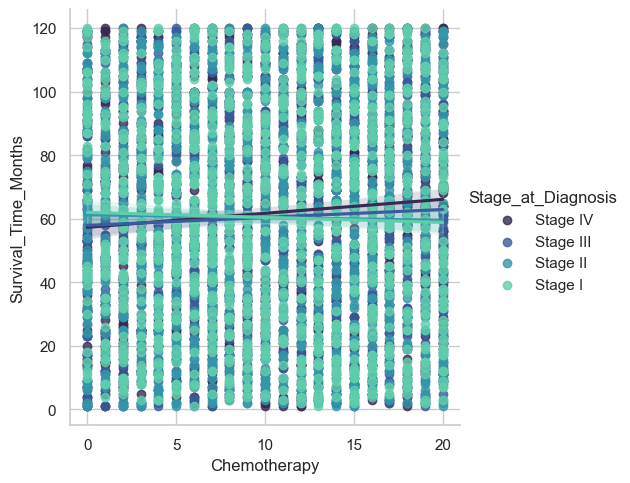

In [64]:
sns.lmplot(data=eye,x='Chemotherapy',y='Survival_Time_Months',palette='mako',hue='Stage_at_Diagnosis')

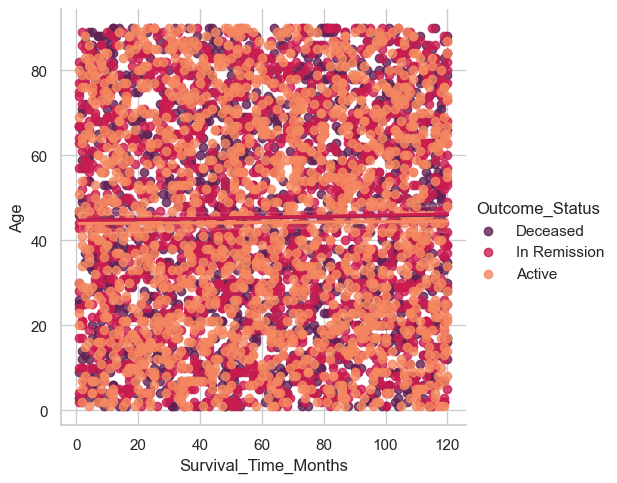

In [65]:
sns.lmplot(data=eye,x='Survival_Time_Months',y='Age',palette='rocket',hue='Outcome_Status')

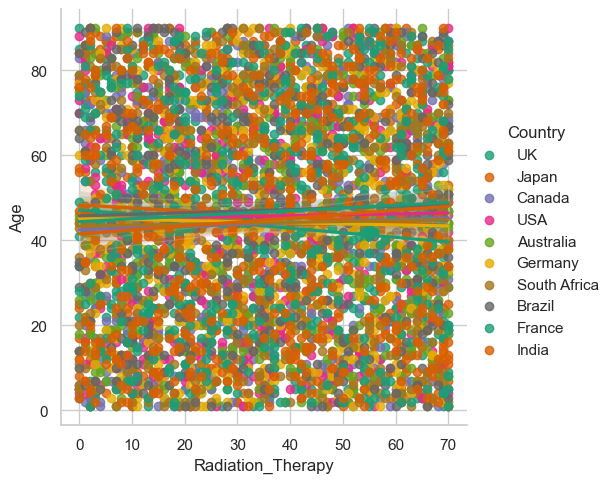

In [66]:
sns.lmplot(data=eye,x='Radiation_Therapy',y='Age',palette='Dark2',hue='Country')

In [67]:
eye.head()

,Patient_ID,Age,Gender,Cancer_Type,Laterality,Date_of_Diagnosis,Stage_at_Diagnosis,Treatment_Type,Surgery_Status,Radiation_Therapy,Chemotherapy,Outcome_Status,Survival_Time_Months,Genetic_Markers,Family_History,Country
0,PID00001,58,F,Retinoblastoma,Left,2019-01-25,Stage IV,Radiation,False,15,3,Deceased,85,Unknown,True,UK
1,PID00002,15,Other,Retinoblastoma,Right,2021-10-21,Stage III,Chemotherapy,True,69,6,In Remission,10,Unknown,True,Japan
2,PID00003,64,M,Retinoblastoma,Bilateral,2021-03-12,Stage IV,Surgery,False,47,6,In Remission,3,BRAF Mutation,False,UK
3,PID00004,33,M,Melanoma,Right,2021-05-10,Stage II,Radiation,True,36,6,Active,40,Unknown,False,Canada
4,PID00005,8,Other,Lymphoma,Left,2019-11-24,Stage I,Chemotherapy,False,14,14,In Remission,26,BRAF Mutation,True,USA


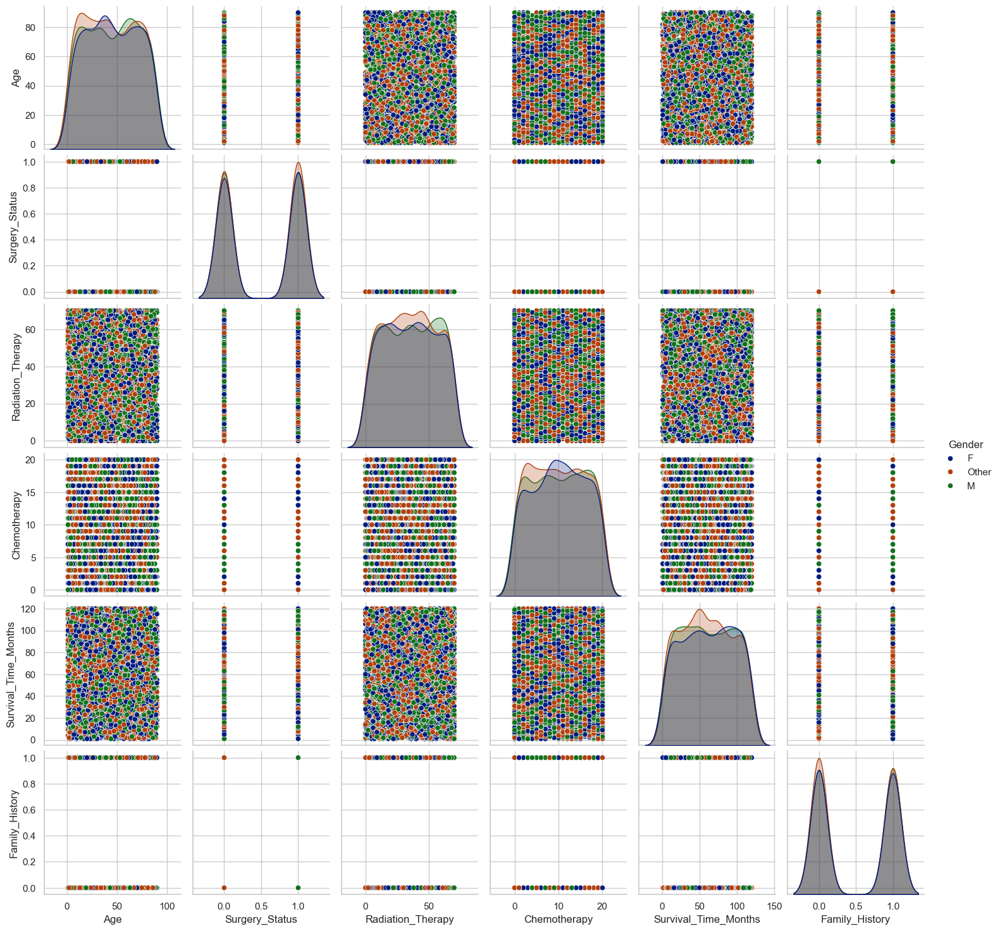

In [68]:
sns.pairplot(eye, hue="Gender",palette='dark')

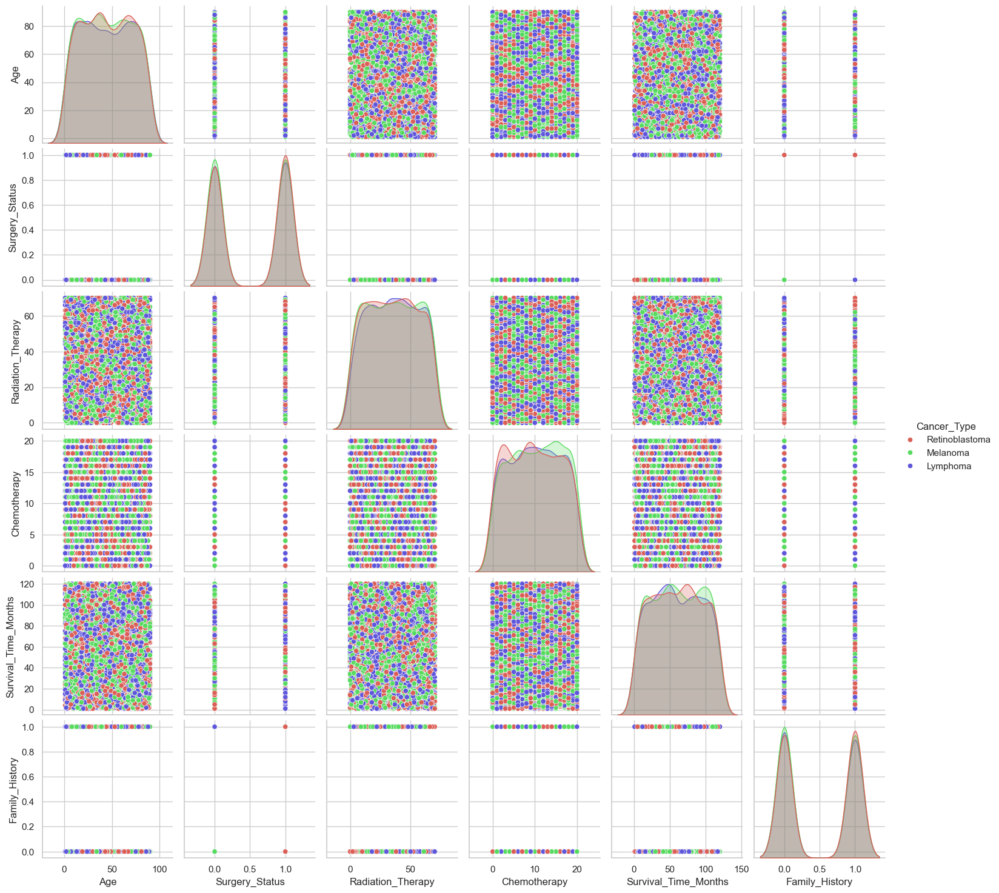

In [69]:
sns.pairplot(eye, hue="Cancer_Type",palette='hls')

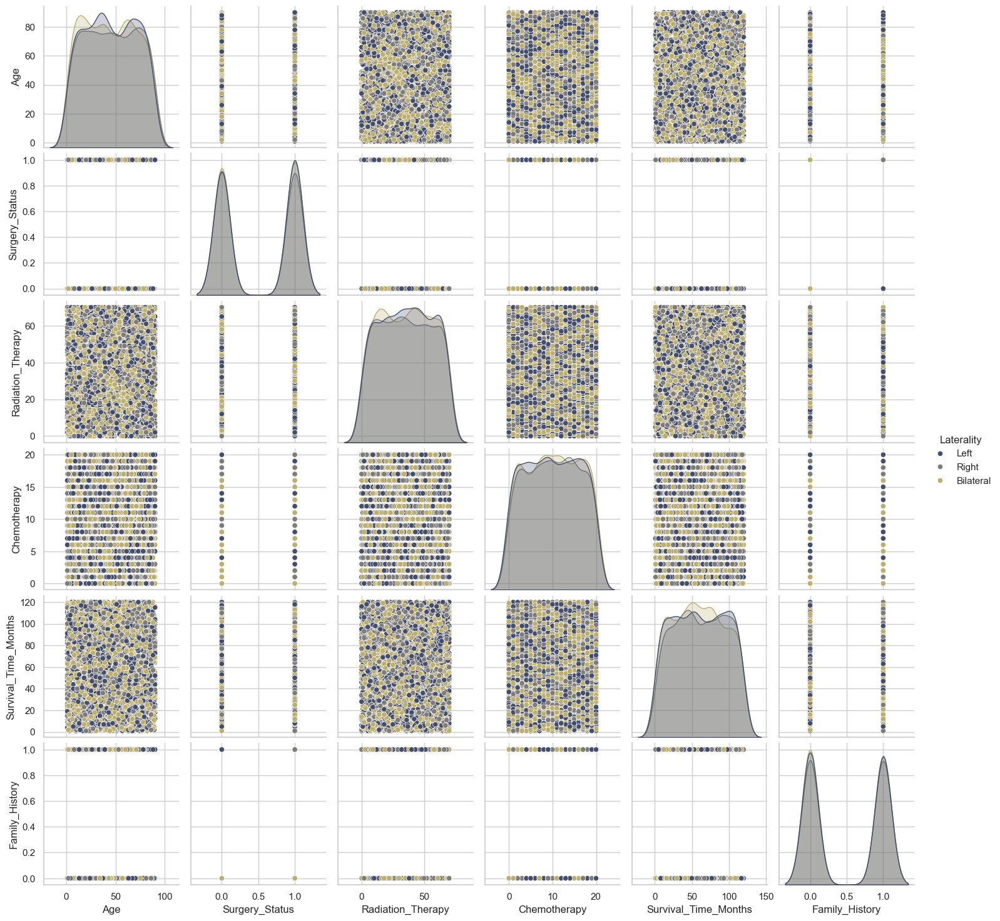

In [70]:
sns.pairplot(eye, hue="Laterality",palette='cividis')

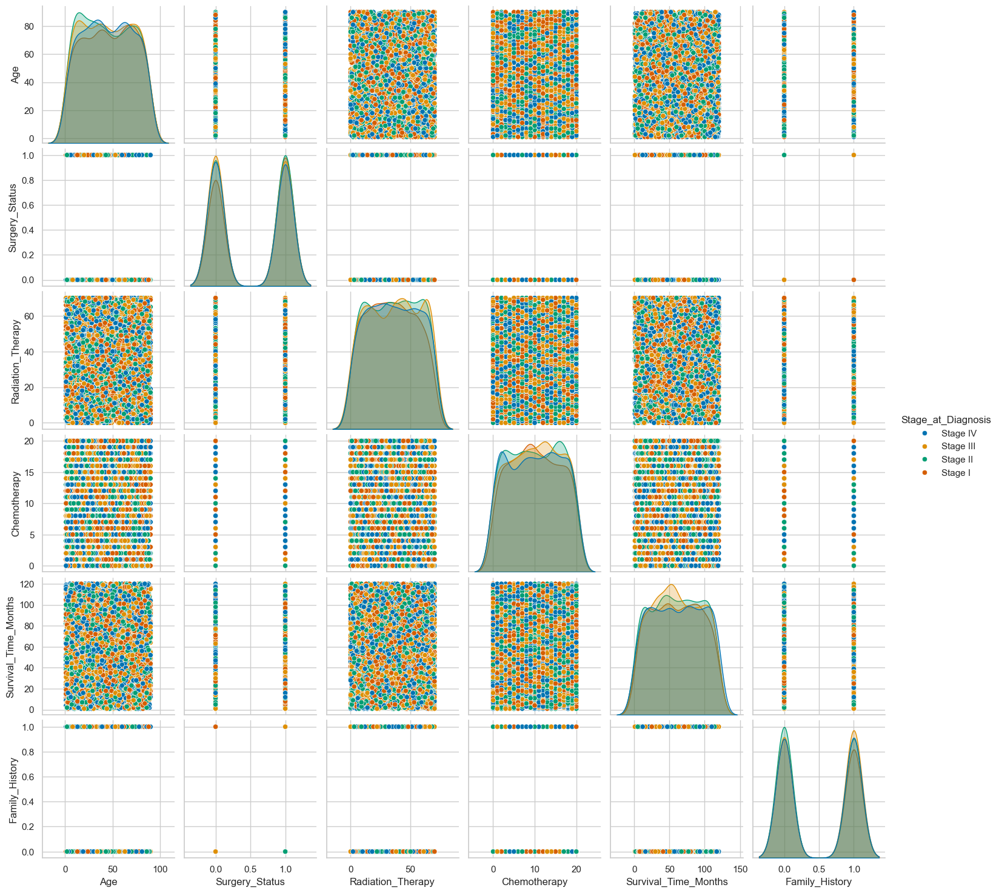

In [71]:
sns.pairplot(eye, hue="Stage_at_Diagnosis",palette='colorblind')

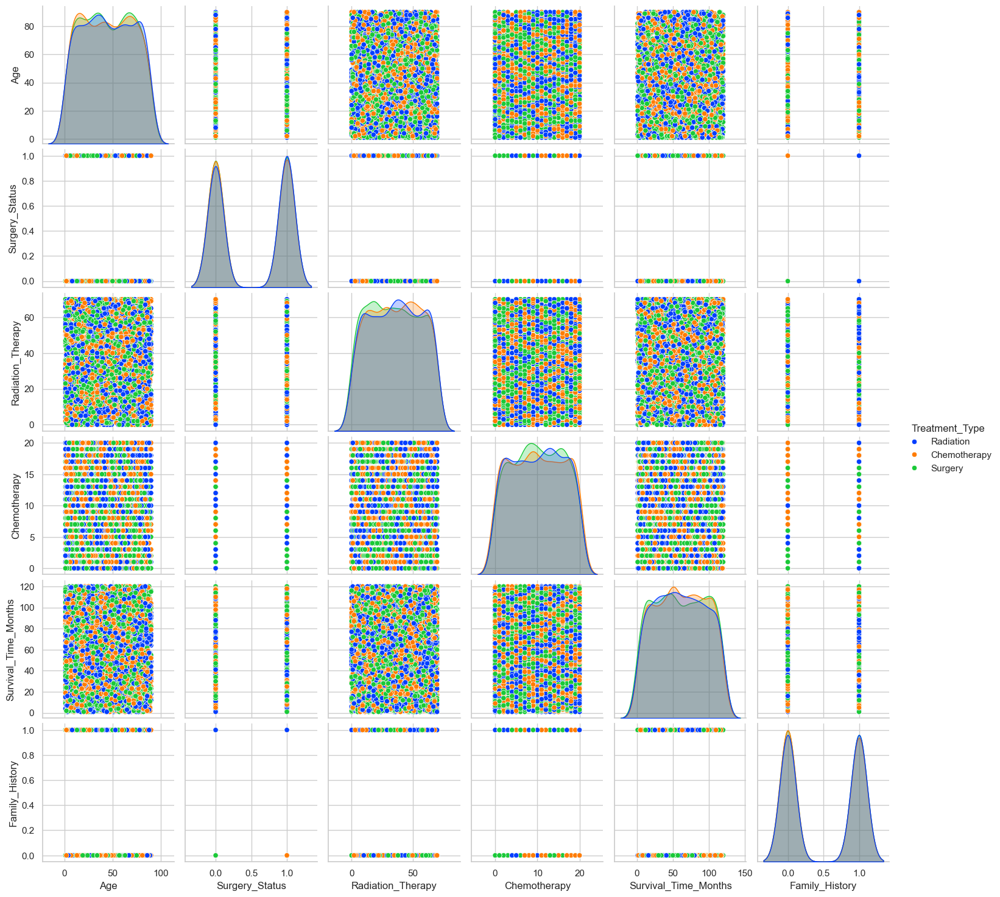

In [72]:
sns.pairplot(eye, hue="Treatment_Type",palette='bright')

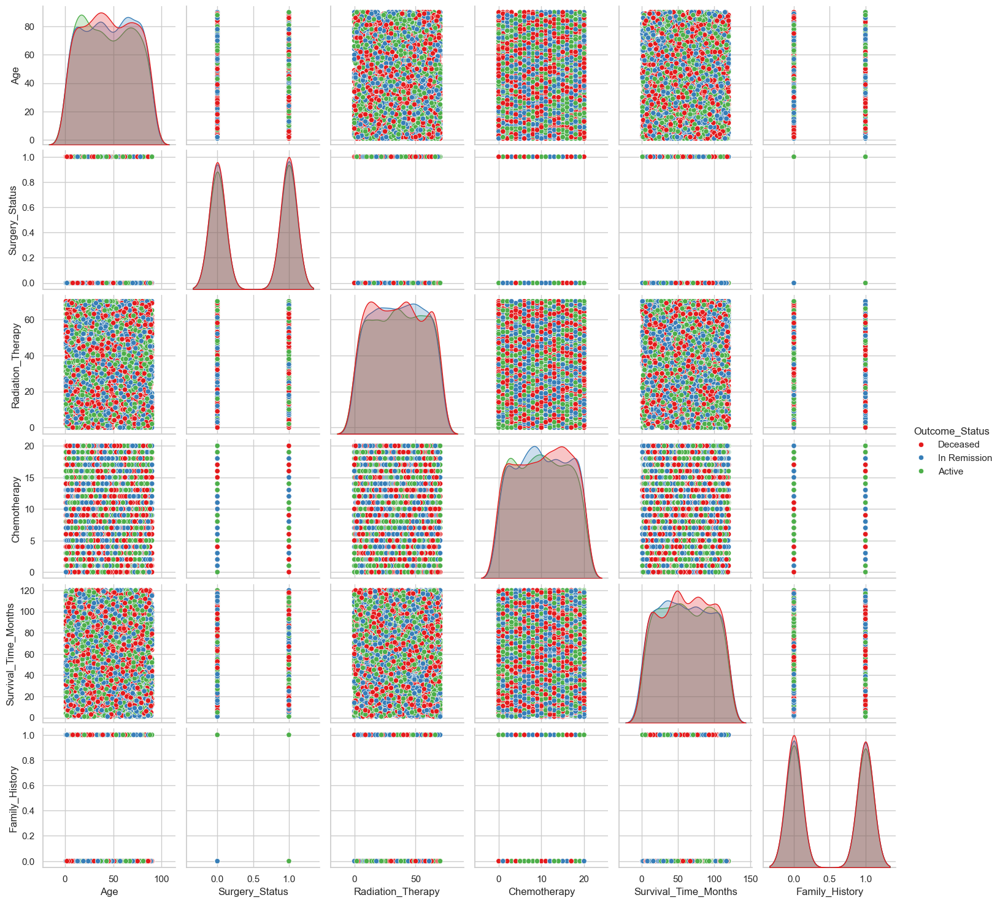

In [73]:
sns.pairplot(eye, hue="Outcome_Status",palette='Set1')

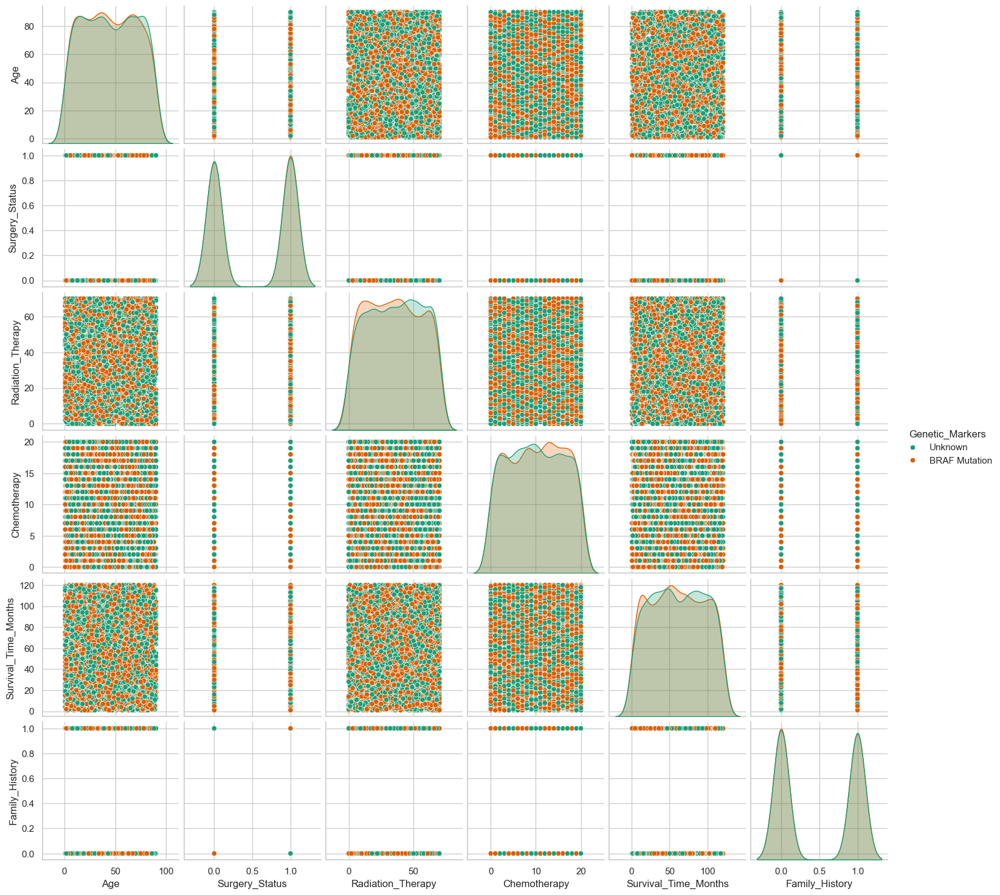

In [74]:
sns.pairplot(eye, hue="Genetic_Markers",palette='Dark2')

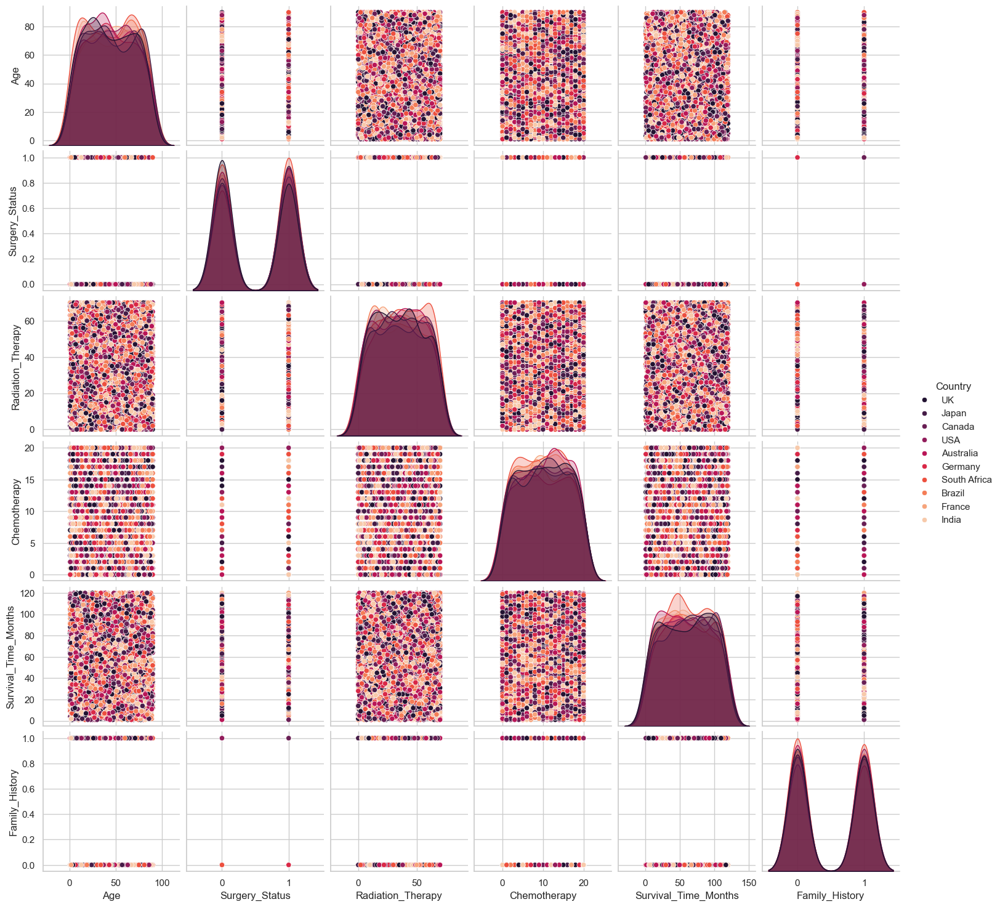

In [75]:
sns.pairplot(eye, hue="Country",palette='rocket')